In [47]:
import folium
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from IPython.display import IFrame
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

In [48]:
#Loading the dataset
House = pd.read_csv('kc_house_data.csv')

#Displaying the First Five Rows.
House.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180.0,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170.0,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770.0,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050.0,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680.0,0,1987,0,98074,47.6168,-122.045,1800,7503


In [49]:
#Displaying basic infomation about the dataset
print(House.info())
print(House.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21611 non-null  float64
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [62]:
#Data Cleaning: Handling missing values and Data type conversions
House = House.dropna() #Drop missing values (alternatively, imputation could be used)
House['date'] = pd.to_datetime(House['date'])  #Converting date to datetime

In [51]:
#Initializing a map centered around the average latitude and longitude
m = folium.Map(location=[House['lat'].mean(), House['long'].mean()], zoom_start=10)

#Adding property locations as markers on the map
for _, row in House.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

#Saving the map to an HTML file
m.save('property_map.html')

#Displaying the map
m

In [63]:
#Creating the map centered around Seattle
m = folium.Map(location=[47.6062, -122.3321], zoom_start=10)

#Adding points for houses on the map
for index, row in House.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=5,
        color='blue' if row['waterfront'] == 1 else 'green',
        fill=True,
        fill_color='red' if row['price'] > 1_000_000 else 'green'
    ).add_to(m)

#Saving map to HTML
m.save('house_price_map.html')

#Displaying the map in my Jupyter Enviroment
IFrame('house_price_map.html', width=800, height=500)


In [53]:
#Calculating the  house age based on the year it was built
House['house_age'] = datetime.now().year - House['yr_built']

#Checking the new column
House[['yr_built', 'house_age']].head()

,yr_built,house_age
0,1955,69
1,1951,73
2,1933,91
3,1965,59
4,1987,37


RMSE: 190985.1334641657


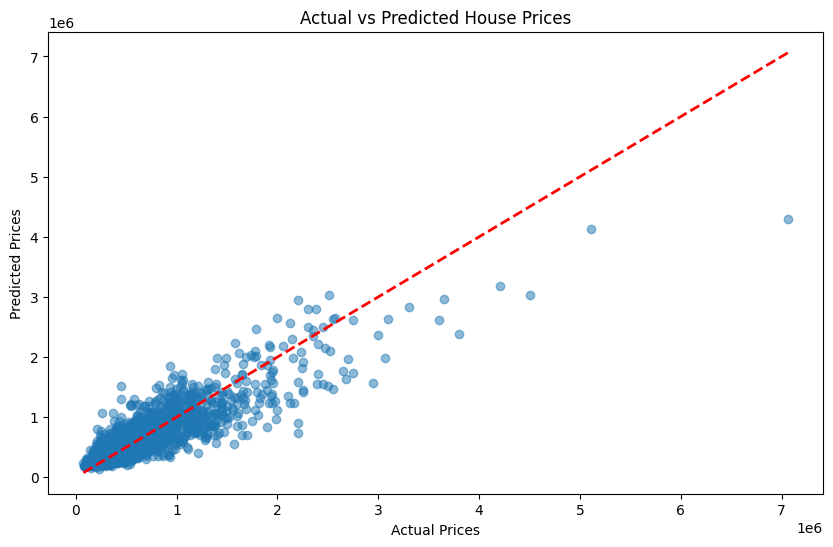

In [54]:
# Feature engineering: create 'house_age'
House['house_age'] = 2024 - House['yr_built']

# Select features and target variable (e.g. price)
X = House[['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'grade', 'house_age']]
y = House['price']

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred = rf_model.predict(X_test)

# Model evaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f"RMSE: {rmse}")

# Visualization: Plot predicted vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted House Prices')
plt.show()


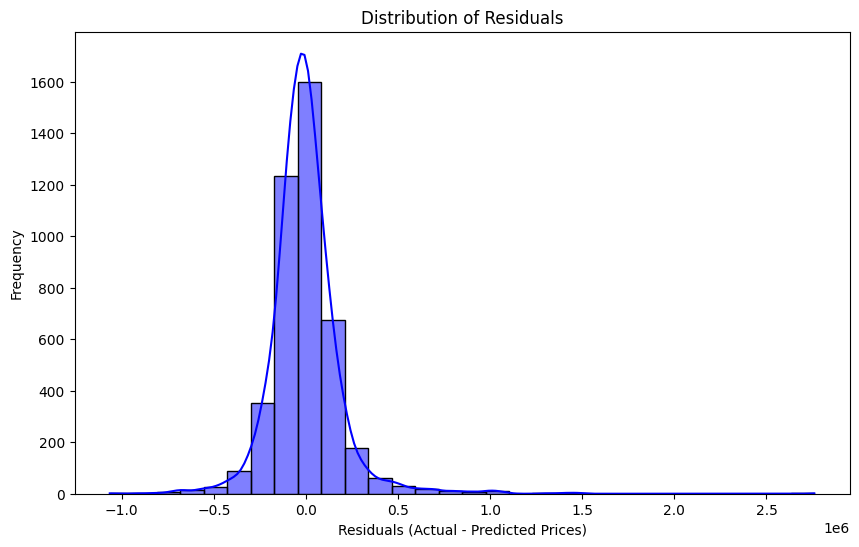

In [55]:
#Residuals plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, color="blue", bins=30)
plt.title('Distribution of Residuals')
plt.xlabel('Residuals (Actual - Predicted Prices)')
plt.ylabel('Frequency')
plt.show()

In [56]:
#Select features and target variable (price)
features = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 
            'waterfront', 'view', 'grade', 'house_age']
X = House[features]
y = House['price']

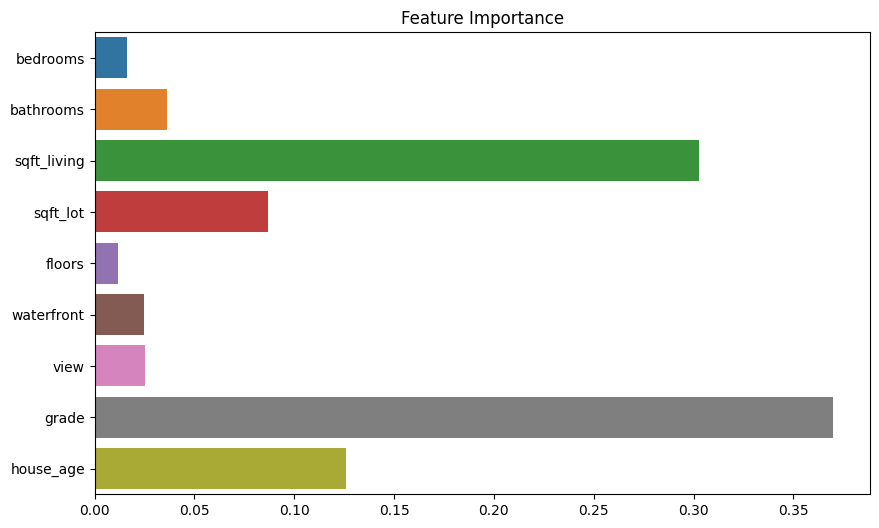

In [57]:
# Visualize feature importance
feature_importance = rf_model.feature_importances_
feature_names = X.columns
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance, y=feature_names)
plt.title('Feature Importance')
plt.show()

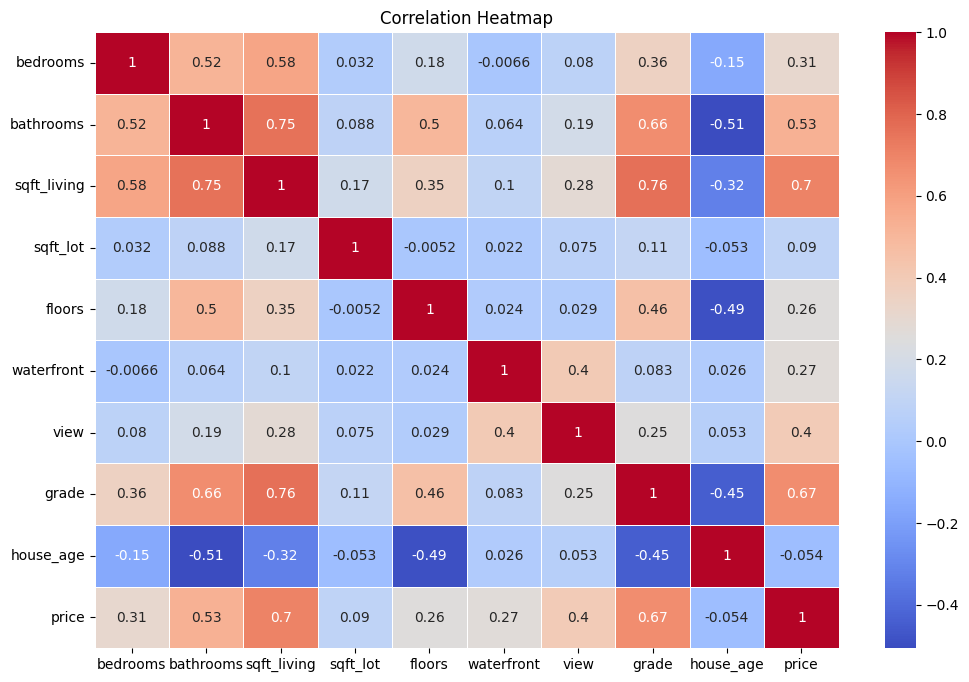

In [58]:
#Correlation Heatmap of the House features
plt.figure(figsize=(12, 8))
sns.heatmap(House[features + ['price']].corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [59]:
#Assuming a mortgage down payment of 20% and a loan term of 30 years
down_payment_percentage = 0.2
loan_term_years = 30
annual_interest_rate = 0.04  #Annual Interest rate

#Calculating down payment and loan amount
House['down_payment'] = House['price'] * down_payment_percentage
House['loan_amount'] = House['price'] - House['down_payment']

#Function to calculate monthly mortgage payment using loan amount
def calculate_mortgage_payment(loan_amount, annual_interest_rate, loan_term_years):
    monthly_interest_rate = annual_interest_rate / 12
    number_of_payments = loan_term_years * 12
    return loan_amount * (monthly_interest_rate * (1 + monthly_interest_rate) ** number_of_payments) / ((1 + monthly_interest_rate) ** number_of_payments - 1)

#Calculating monthly mortgage payments
House['monthly_mortgage_payment'] = House['loan_amount'].apply(lambda x: calculate_mortgage_payment(x, annual_interest_rate, loan_term_years))

#Displaying the updated dataset with loan amounts and mortgage payments
House[['price', 'loan_amount', 'monthly_mortgage_payment']].head()

,price,loan_amount,monthly_mortgage_payment
0,221900.0,177520.0,847.507633
1,538000.0,430400.0,2054.795432
2,180000.0,144000.0,687.478025
3,604000.0,483200.0,2306.870708
4,510000.0,408000.0,1947.854405


In [60]:
# asciiWith the insurance at 0.5% of the property value annually
insurance_rate = 0.005

#Estimating annual insurance premium
House['annual_insurance_premium'] = House['price'] * insurance_rate

#Displaying  the updated dataset with estimated insurance premiums
House[['price', 'annual_insurance_premium']].head()

,price,annual_insurance_premium
0,221900.0,1109.5
1,538000.0,2690.0
2,180000.0,900.0
3,604000.0,3020.0
4,510000.0,2550.0


In [61]:
#Creating a target variable called 'high_risk' where 1 is high risk and 0 is low risk
# This would  be calculated from historical data, claims or financial risks

#Creating synthetic 'high_risk' target
np.random.seed(42)
House['high_risk'] = np.random.choice([0, 1], size=len(House), p=[0.7, 0.3])

#Selecting features and target
X = House[['sqft_living', 'bedrooms', 'bathrooms', 'floors', 'view', 'grade', 'house_age', 'monthly_mortgage_payment']]
y = House['high_risk']

#Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Training a Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

#Predict and evaluate the model
y_pred = rf_model.predict(X_test)

#Model evaluation
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[2823  231]
 [1157  112]]
              precision    recall  f1-score   support

           0       0.71      0.92      0.80      3054
           1       0.33      0.09      0.14      1269

    accuracy                           0.68      4323
   macro avg       0.52      0.51      0.47      4323
weighted avg       0.60      0.68      0.61      4323

